In [32]:
import pandas as pd
import matplotlib as pltl
import seaborn as sns
from dataclasses import dataclass
from math import log
from typing import Dict, Iterable, Tuple

from click.formatting import iter_rows

In [33]:
# load the premier league
pl = pd.read_csv('/Users/luisenriquekaiser/Documents/soccer_betting_forecast/data/processed/eng-premier_league_schedule_updated.csv')

In [34]:

pl["score"].unique()

array(['2–2', '0–2', '0–0', '1–3', '3–1', '2–0', '0–1', '2–1', '1–0',
       '1–2', '0–3', '1–1', '4–1', '4–0', '2–3', '1–4', '5–1', '3–2',
       '4–2', '3–0', '2–5', '2–4', '0–4', '3–3', '4–3', '7–0', '5–0',
       '6–1', '6–2', '6–0', '3–4', '7–4', '4–4', '0–5', '7–1', '5–3',
       '6–4', '1–5', '0–6', '2–6', '8–1', '5–2', '1–6', '9–1', '7–2',
       '8–0', '8–2', '3–5', '7–3', '5–5', '6–3', '3–6', '4–5', '5–4',
       '1–7', '0–9', '0–7', '9–0', '0–8'], dtype=object)

In [35]:
pl['score'] = pl['score'].astype(str).str.strip()
# Normalize dash characters
pl['score'] = pl['score'].str.replace('[–—−]', '-', regex=True)

# Split into home and away goals
goals = pl['score'].str.split('-', expand=True)
pl['home_goals'] = goals[0].astype(int)
pl['away_goals'] = goals[1].astype(int)


In [36]:
pl["goal_diff"] = pl["home_goals"] - pl["away_goals"]

In [1]:
import numpy as np

def exp_goal_diff(c, hr, ar):          # choose asymmetric exp or sinh; here: sinh (odd)
    if not (c > 0):
        raise ValueError("c must be > 0")
    return np.sinh(hr/c) - np.sinh(ar/c)

def get_error(obs_gd, exp_gd):
    return obs_gd - exp_gd

def get_weighted_error(eta, err):
    if np.isclose(err, 0.0):
        return 0.0, 0.0
    mag = eta * np.log10(1.0 + np.abs(err))
    sgn = np.sign(err)
    return mag*sgn, -mag*sgn  # opposite by construction

def update_ratings(wehome, weaway, hrhome, hraway, arhome, araway, mu1, mu2):
    dh = wehome * mu1
    da = weaway * mu1
    hrhome_new = hrhome + dh
    hraway_new = hraway - mu2 * dh     # reallocation within team
    araway_new = araway + da
    arhome_new = arhome - mu2 * da     # reallocation within team
    return hrhome_new, hraway_new, arhome_new, araway_new


In [2]:
params = [800, 0.05, 0.5]

In [3]:

df = pl.copy()
# order dataset
df = df.reset_index(drop = True)

    # get team names and initialise pi ratings
teams = pd.concat([df['home_team'], df['away_team']]).unique()
keys = list(set(list(df['home_team']) + list(df['home_team'])))

pi_dictionary = {f"Home {key}": 0 for key in keys}
pi_dictionary.update({f"Away {key}": 0 for key in keys})

c = params[0]
mu1 = params[1]
mu2 = params[2]

home_key = 'Home {}'
away_key = 'Away {}'

df_list = df.values.tolist()







NameError: name 'pl' is not defined

In [40]:
# ensure the output columns exist
out_cols = [
    'Home Home Rating', 'Home Away Rating',
    'Away Home Rating', 'Away Away Rating',
    'Exp GD Pi', 'Pi Diff'
]
for col in out_cols:
    if col not in df.columns:
        df[col] = np.nan

# iterate matches in order and write values into df
for i, row in df.iterrows():

    home = row["home_team"]
    away = row["away_team"]
    home_score = row["home_goals"]
    away_score = row["away_goals"]

    # current ratings
    h_hr = pi_dictionary[home_key.format(home)]
    h_ar = pi_dictionary[away_key.format(home)]
    a_hr = pi_dictionary[home_key.format(away)]
    a_ar = pi_dictionary[away_key.format(away)]

    # write current ratings into the row (auditing)
    df.at[i, 'Home Home Rating'] = h_hr
    df.at[i, 'Home Away Rating'] = h_ar
    df.at[i, 'Away Home Rating'] = a_hr
    df.at[i, 'Away Away Rating'] = a_ar

    # expected GD from ratings
    egd = exp_goal_diff(c, h_hr, a_ar)
    df.at[i, 'Exp GD Pi'] = egd
    df.at[i, 'Pi Diff'] = h_hr - a_ar

    # observed GD
    obs_gd = home_score - away_score

    # signed error and symmetric weight updates
    err = obs_gd - egd
    if err == 0:
        wehome = 0.0
        weaway = 0.0
    else:
        we_mag = c * np.log10(1 + np.abs(err))   # non-linear magnitude
        wehome = we_mag * np.sign(err)
        weaway = -wehome

    # update ratings (make sure update_ratings uses hraway correctly)
    h_hr_new, h_ar_new, a_hr_new, a_ar_new = update_ratings(
        wehome, weaway, h_hr, h_ar, a_hr, a_ar, mu1, mu2
    )

    # write back to the dictionaries for subsequent matches
    pi_dictionary[home_key.format(home)] = h_hr_new
    pi_dictionary[away_key.format(home)] = h_ar_new
    pi_dictionary[home_key.format(away)] = a_hr_new
    pi_dictionary[away_key.format(away)] = a_ar_new


In [42]:
# create a season column based on the date. the season starts in august and ends in may
df['date'] = pd.to_datetime(df['date'])
df['season'] = df['date'].apply(lambda x: f"{x.year}-{x.year+1}" if x.month >= 8 else f"{x.year-1}-{x.year}")

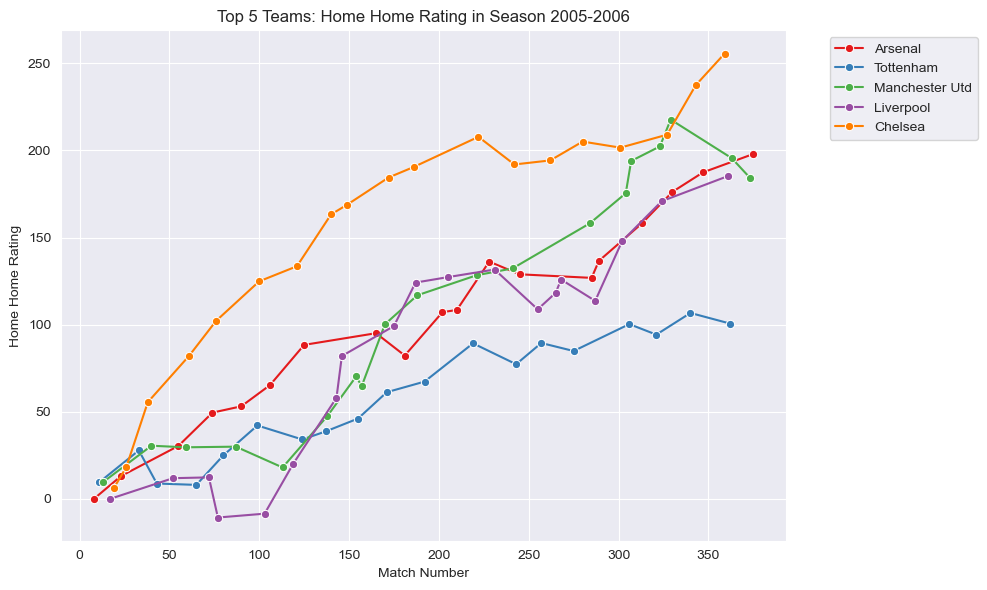

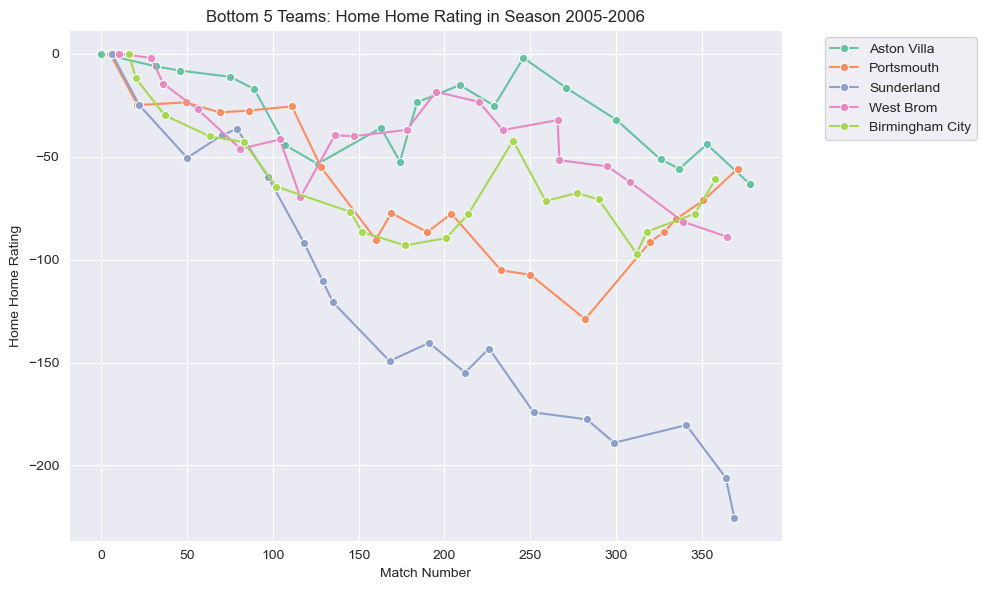

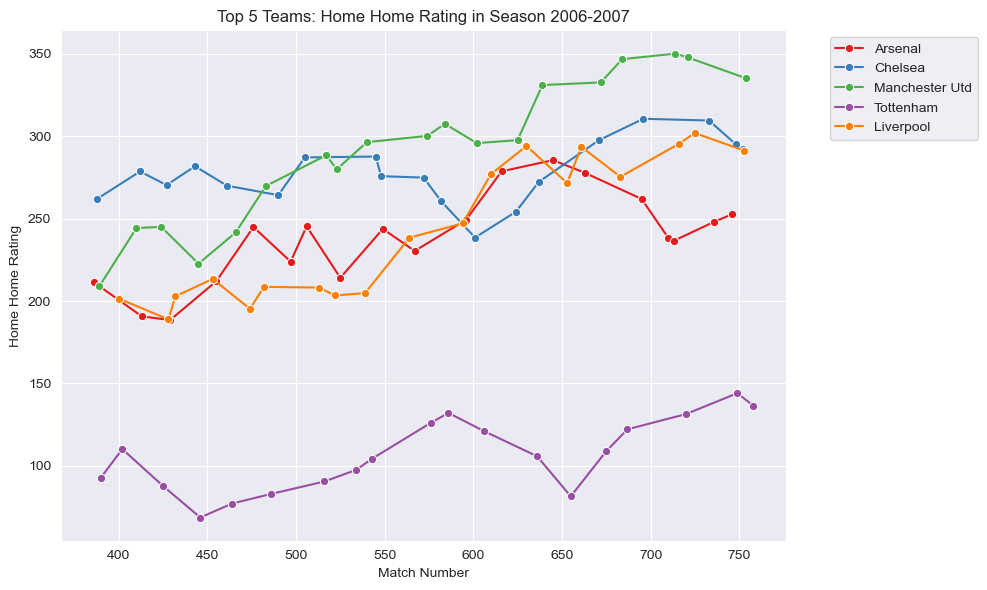

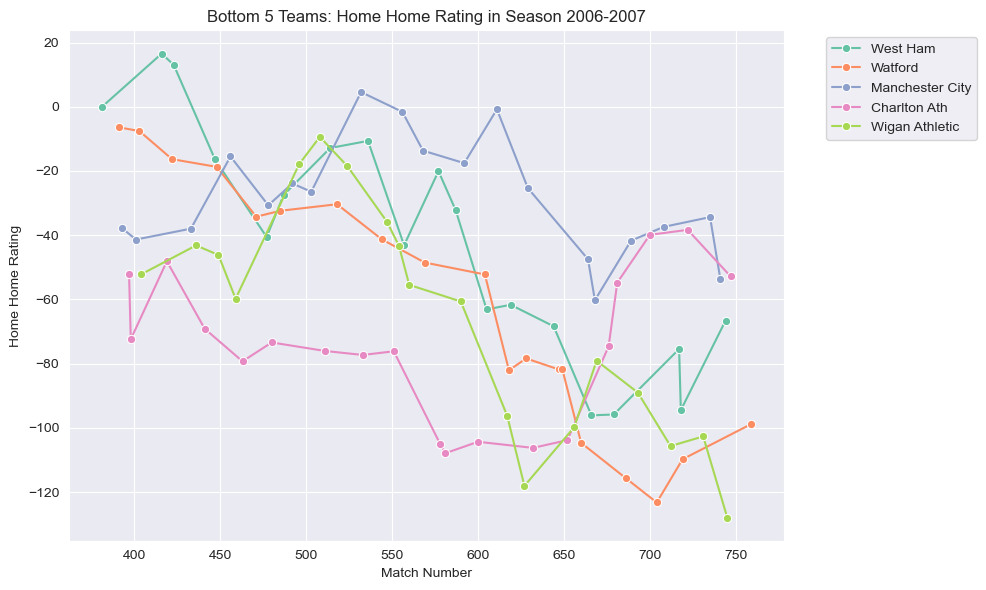

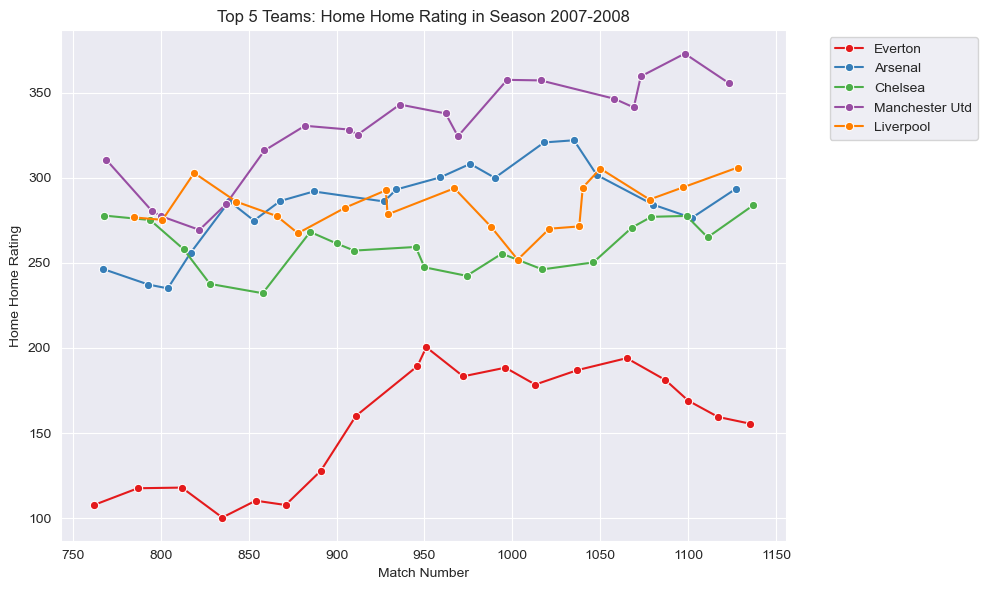

...

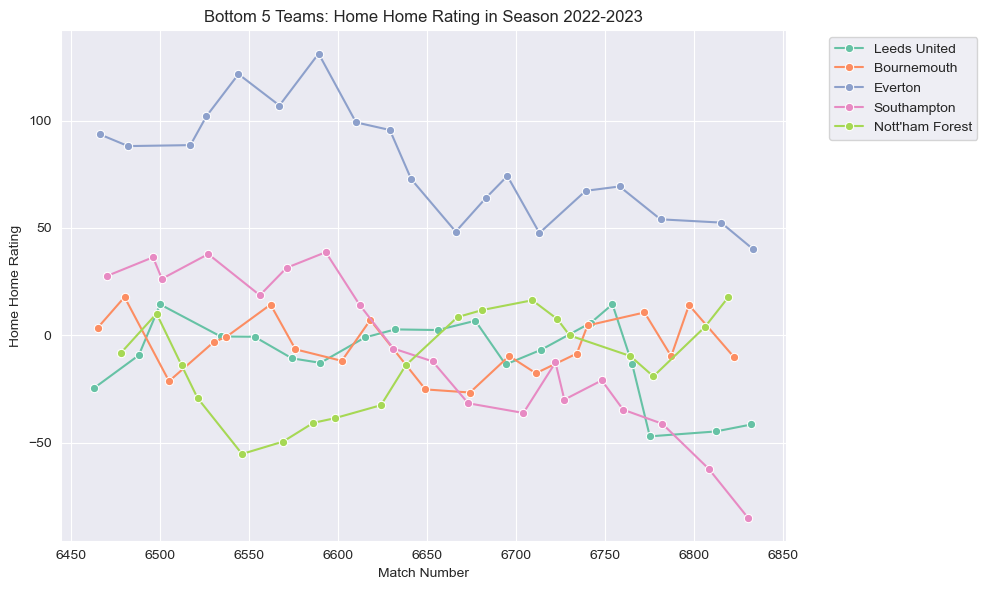

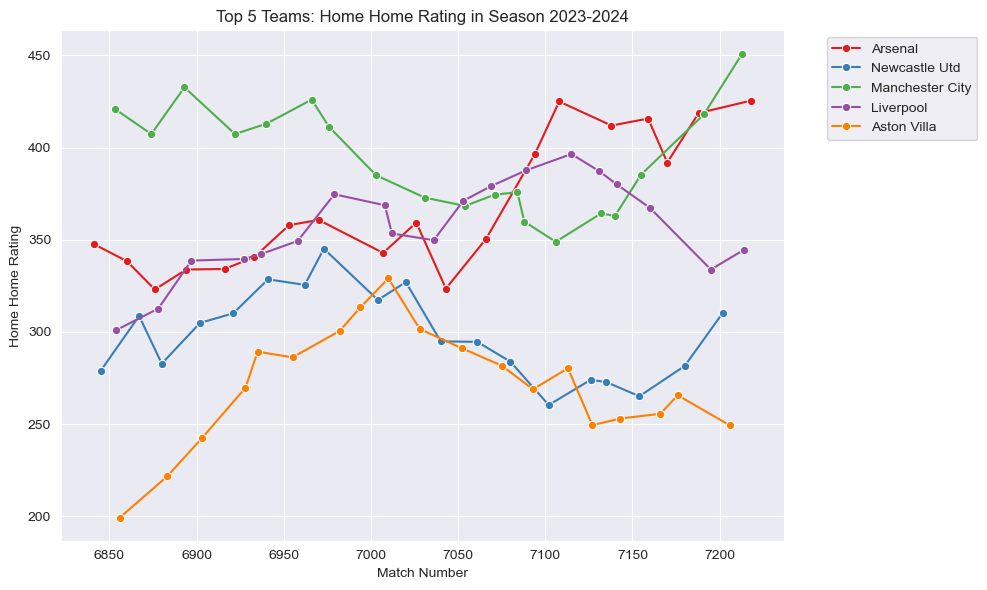

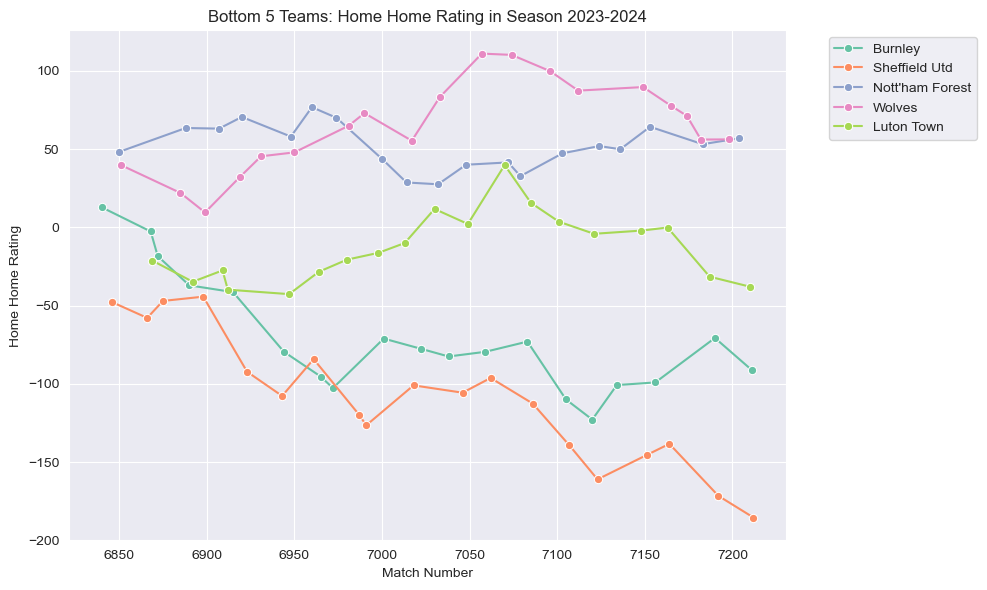

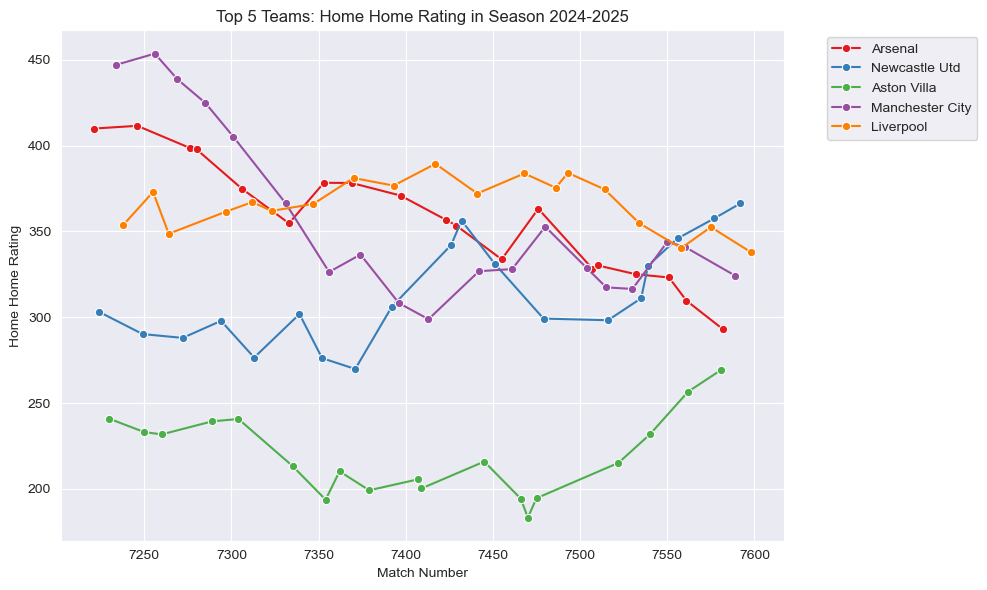

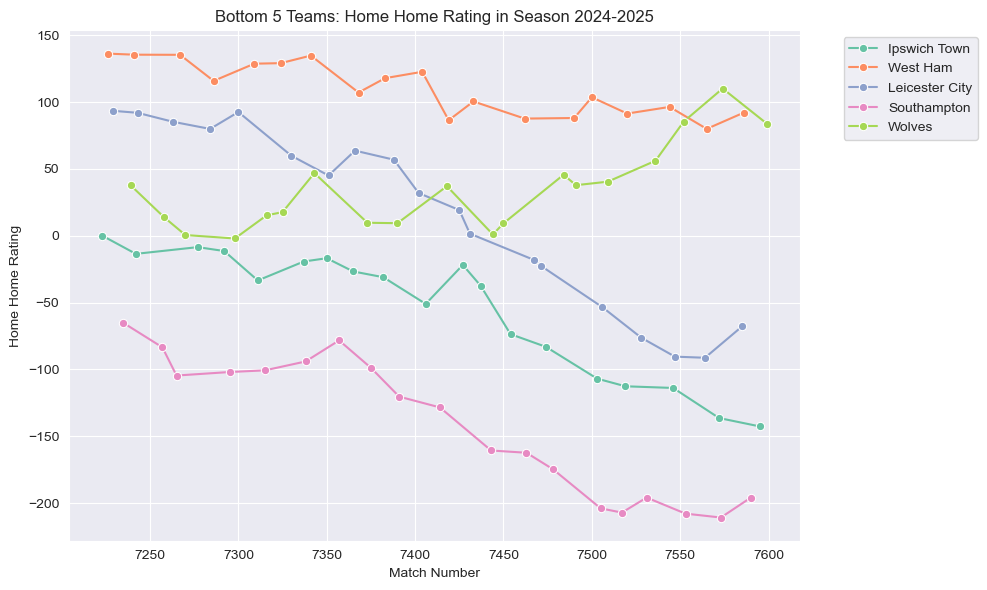

In [43]:
import matplotlib.pyplot as plt
import seaborn as sns

top_palette = sns.color_palette("Set1", 5)      # 5 distinct colors for top
bottom_palette = sns.color_palette("Set2", 5)   # 5 distinct colors for bottom

seasons = df['season'].unique()
for season in seasons:
    season_df = df[df['season'] == season]
    last_matches = season_df.groupby('home_team').tail(1)
    sorted_teams = last_matches.sort_values('Home Home Rating', ascending=False)['home_team']
    top5 = sorted_teams.head(5).tolist()
    bottom5 = sorted_teams.tail(5).tolist()

    # Top 5 plot
    plot_df_top = season_df[season_df['home_team'].isin(top5)]
    plt.figure(figsize=(10, 6))
    sns.lineplot(
        data=plot_df_top,
        x=plot_df_top.index,
        y='Home Home Rating',
        hue='home_team',
        palette=top_palette,
        marker='o'
    )
    plt.title(f'Top 5 Teams: Home Home Rating in Season {season}')
    plt.xlabel('Match Number')
    plt.ylabel('Home Home Rating')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # Bottom 5 plot
    plot_df_bottom = season_df[season_df['home_team'].isin(bottom5)]
    plt.figure(figsize=(10, 6))
    sns.lineplot(
        data=plot_df_bottom,
        x=plot_df_bottom.index,
        y='Home Home Rating',
        hue='home_team',
        palette=bottom_palette,
        marker='o'
    )
    plt.title(f'Bottom 5 Teams: Home Home Rating in Season {season}')
    plt.xlabel('Match Number')
    plt.ylabel('Home Home Rating')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

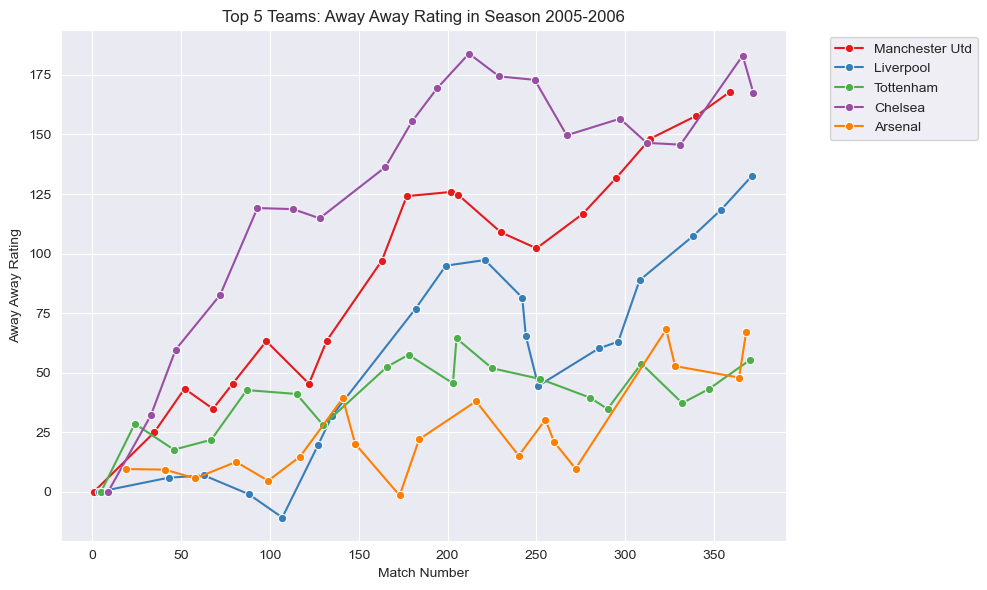

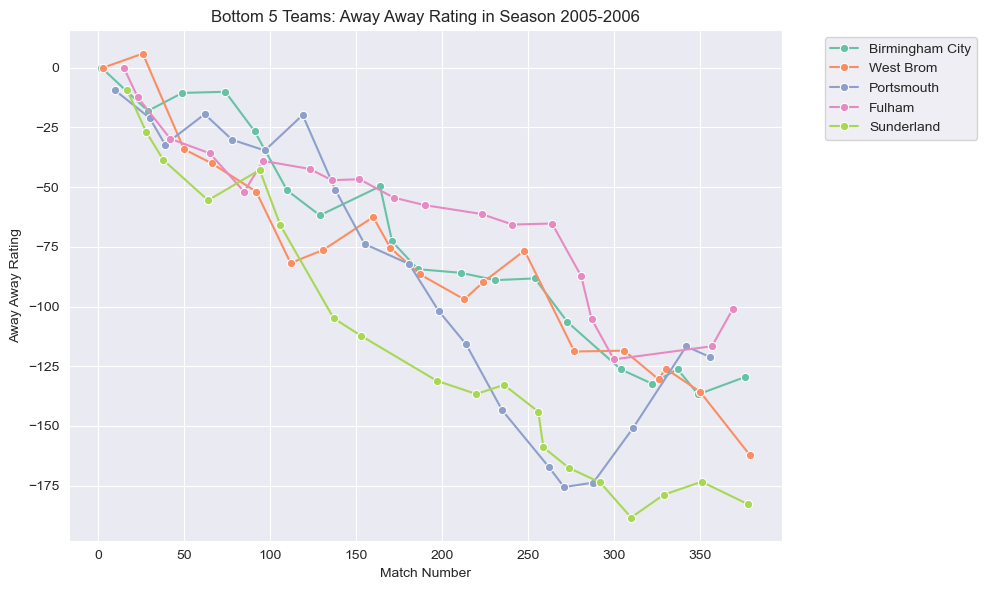

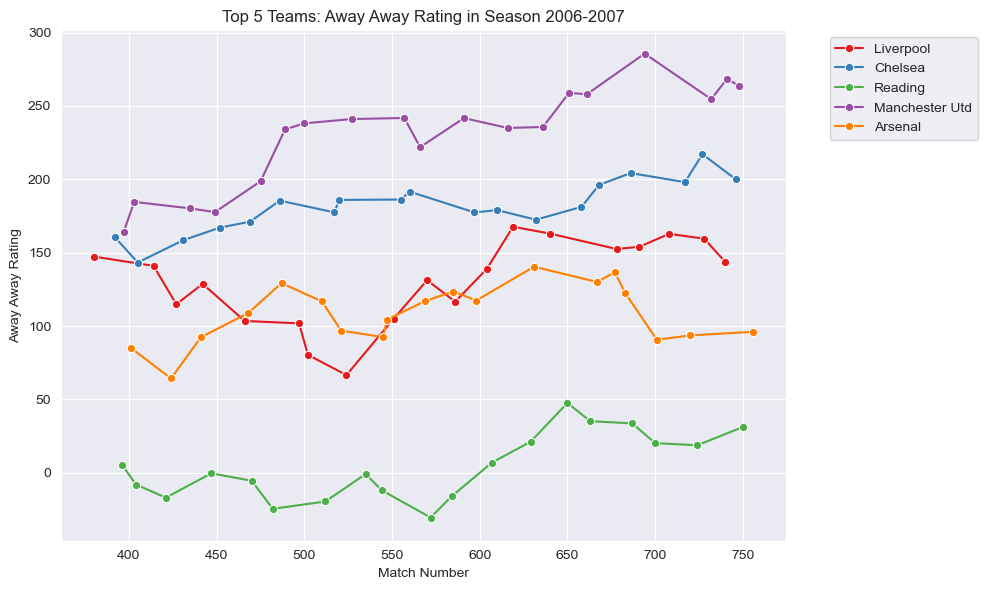

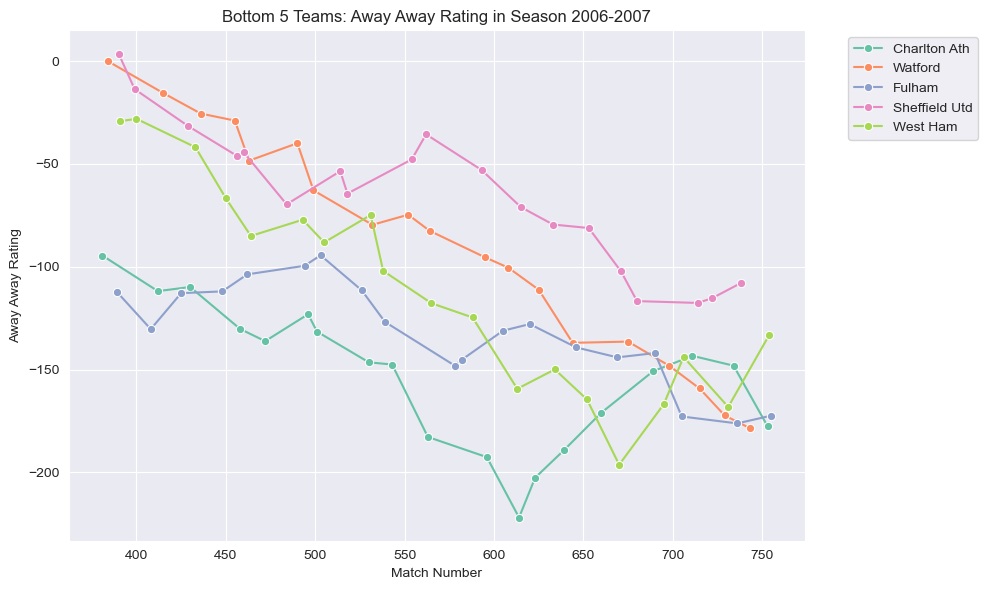

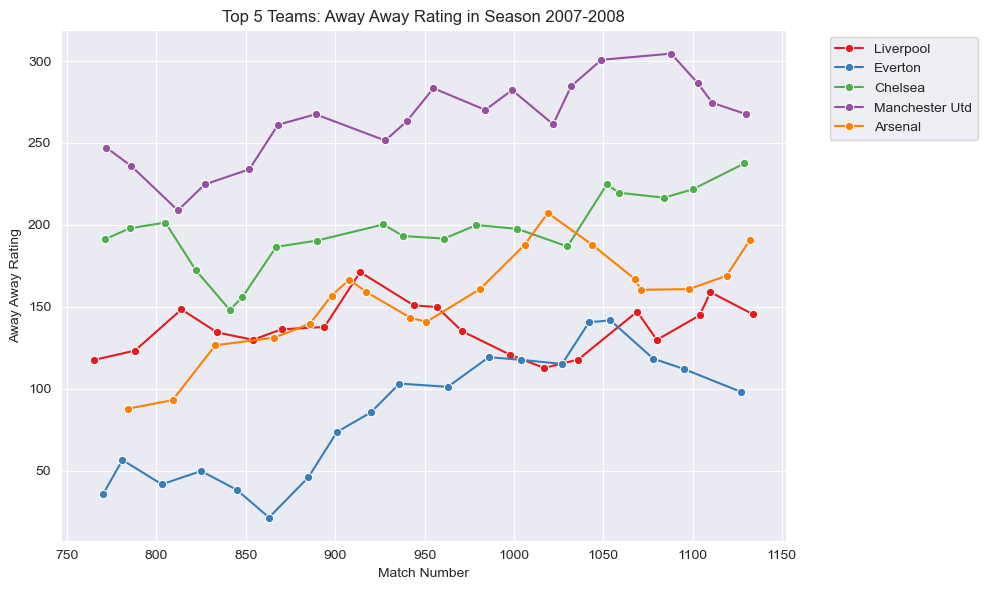

...

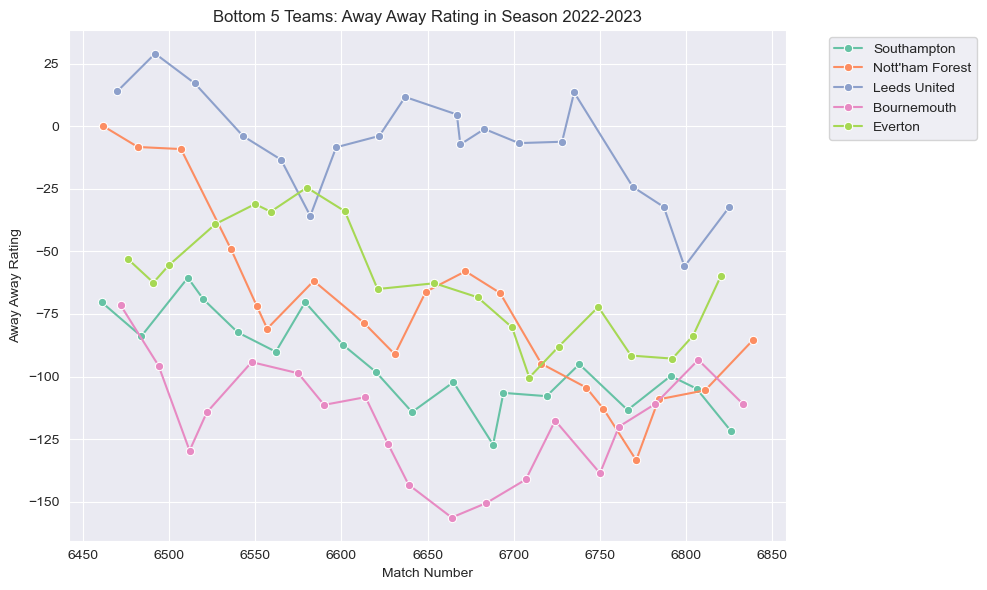

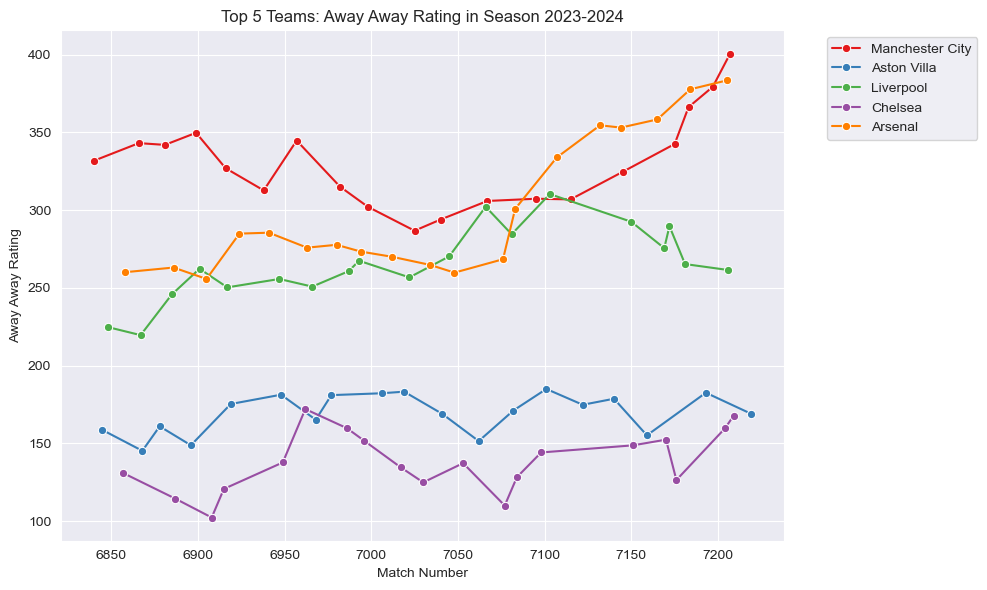

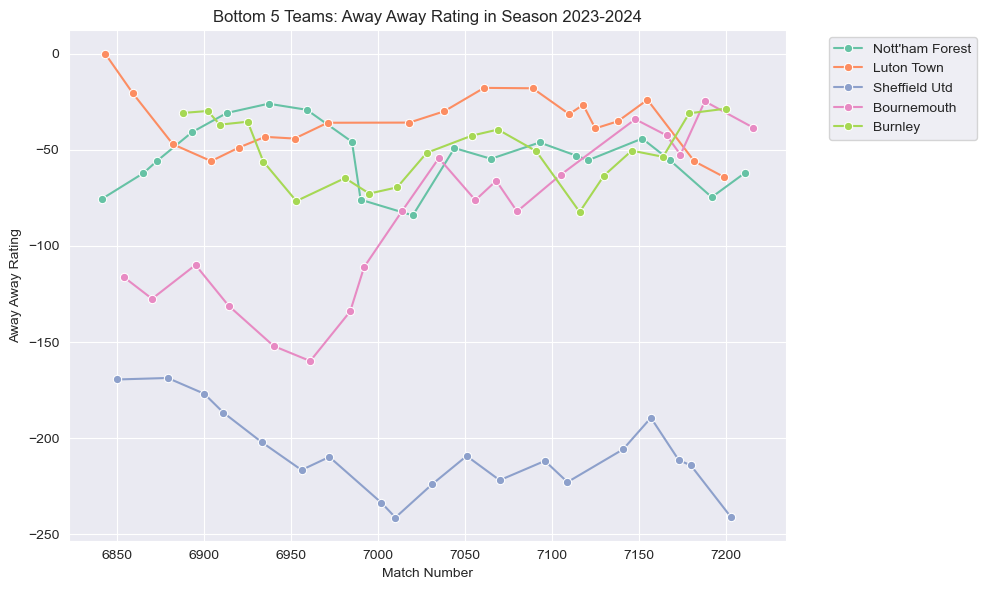

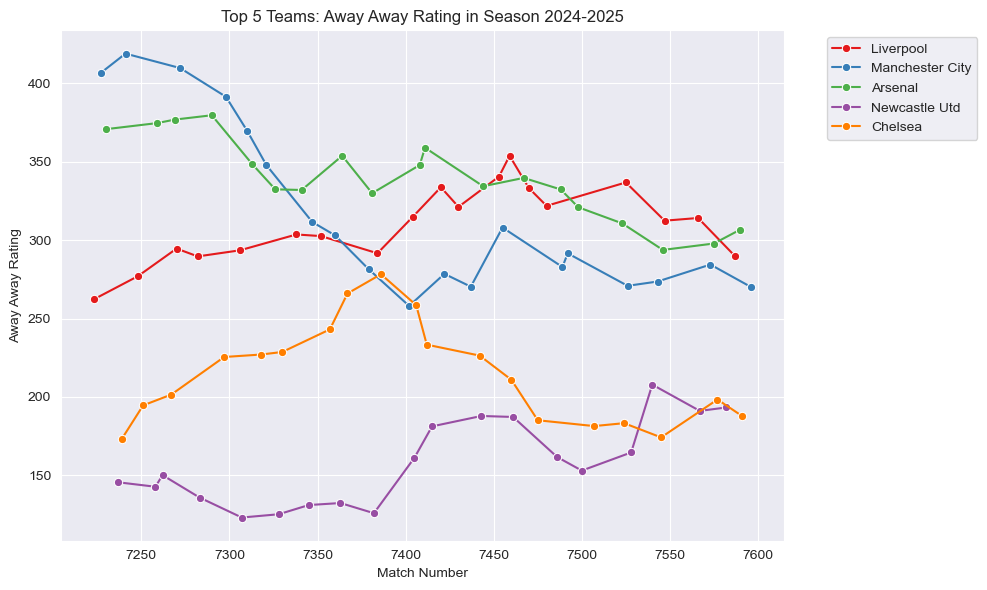

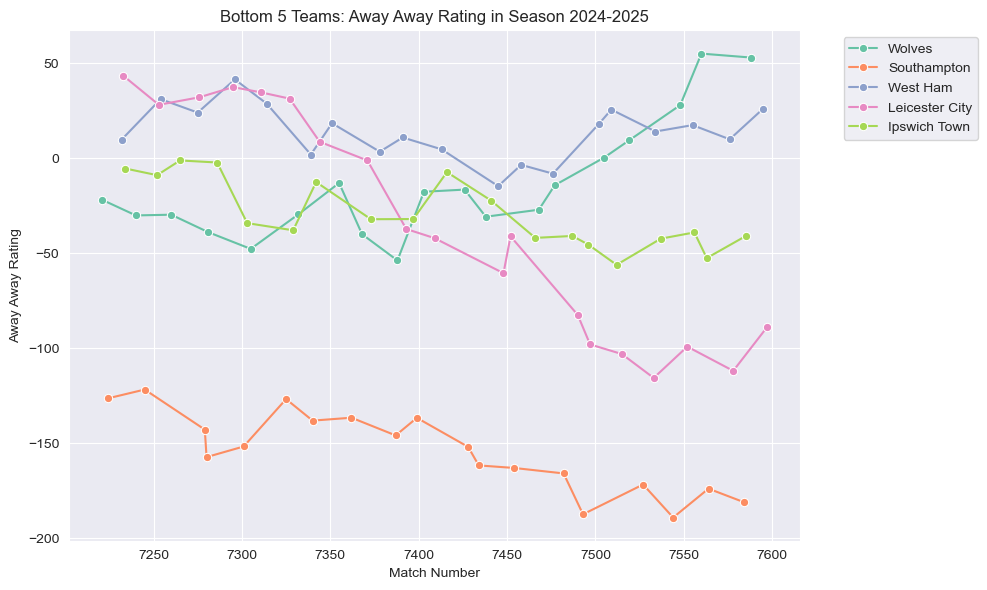

In [44]:
import matplotlib.pyplot as plt
import seaborn as sns

top_palette = sns.color_palette("Set1", 5)
bottom_palette = sns.color_palette("Set2", 5)

seasons = df['season'].unique()
for season in seasons:
    season_df = df[df['season'] == season]
    last_matches = season_df.groupby('away_team').tail(1)
    sorted_teams = last_matches.sort_values('Away Away Rating', ascending=False)['away_team']
    top5 = sorted_teams.head(5).tolist()
    bottom5 = sorted_teams.tail(5).tolist()

    # Top 5 plot
    plot_df_top = season_df[season_df['away_team'].isin(top5)]
    plt.figure(figsize=(10, 6))
    sns.lineplot(
        data=plot_df_top,
        x=plot_df_top.index,
        y='Away Away Rating',
        hue='away_team',
        palette=top_palette,
        marker='o'
    )
    plt.title(f'Top 5 Teams: Away Away Rating in Season {season}')
    plt.xlabel('Match Number')
    plt.ylabel('Away Away Rating')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # Bottom 5 plot
    plot_df_bottom = season_df[season_df['away_team'].isin(bottom5)]
    plt.figure(figsize=(10, 6))
    sns.lineplot(
        data=plot_df_bottom,
        x=plot_df_bottom.index,
        y='Away Away Rating',
        hue='away_team',
        palette=bottom_palette,
        marker='o'
    )
    plt.title(f'Bottom 5 Teams: Away Away Rating in Season {season}')
    plt.xlabel('Match Number')
    plt.ylabel('Away Away Rating')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

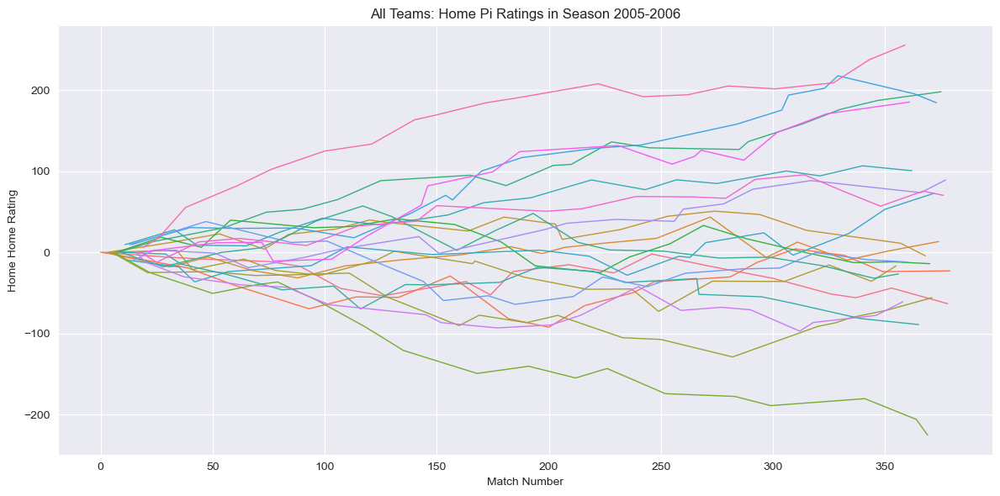

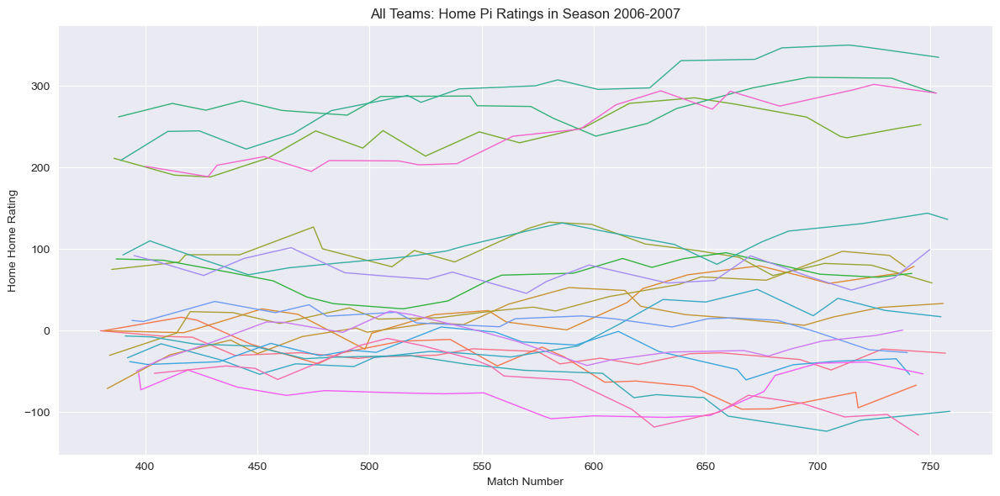

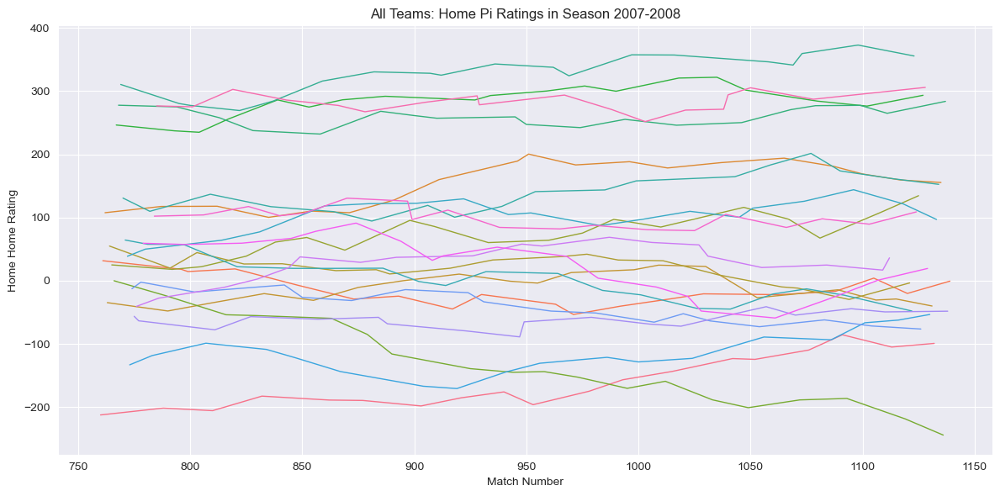

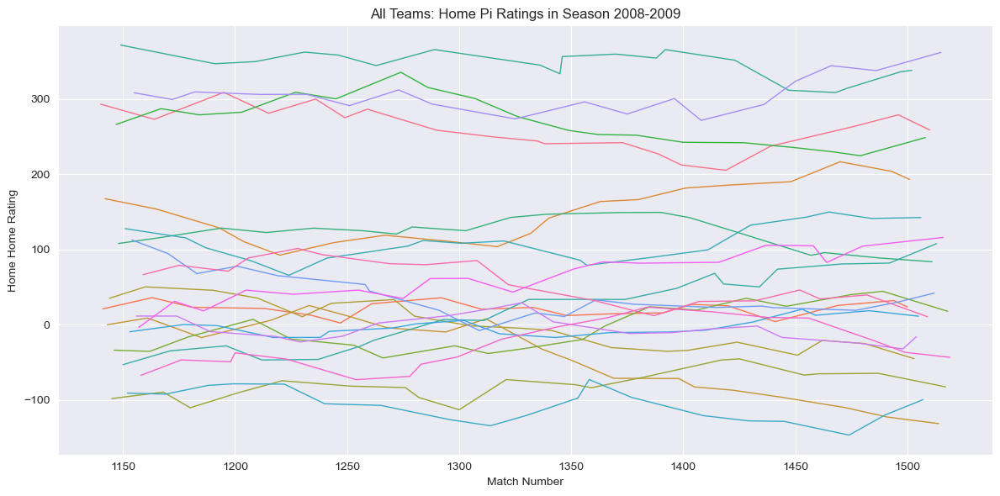

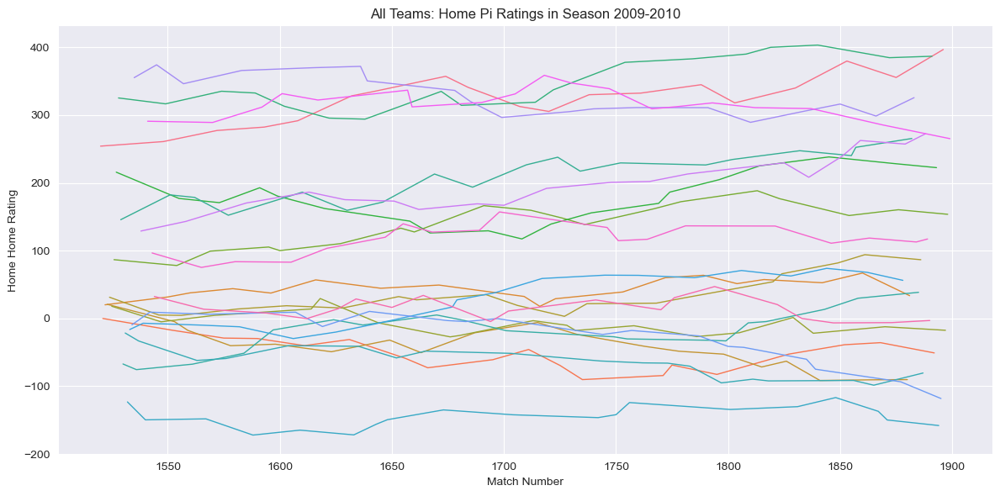

...

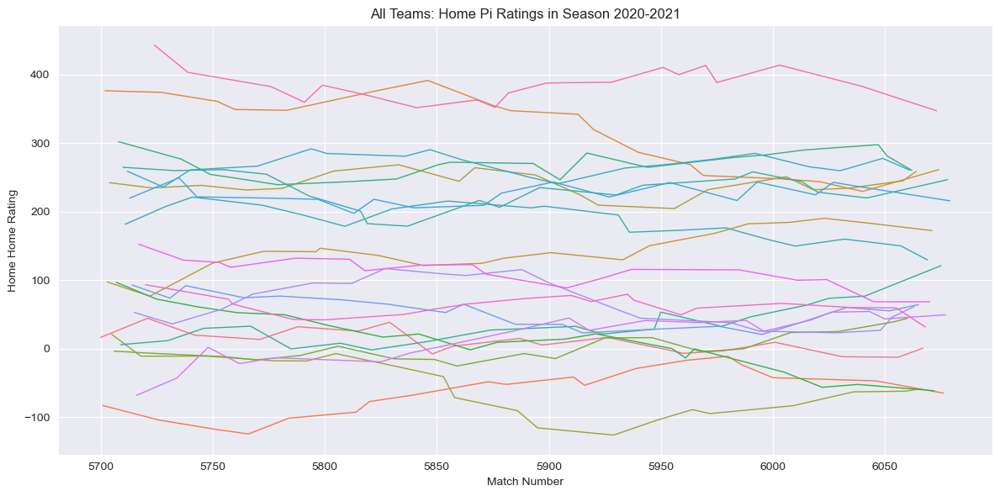

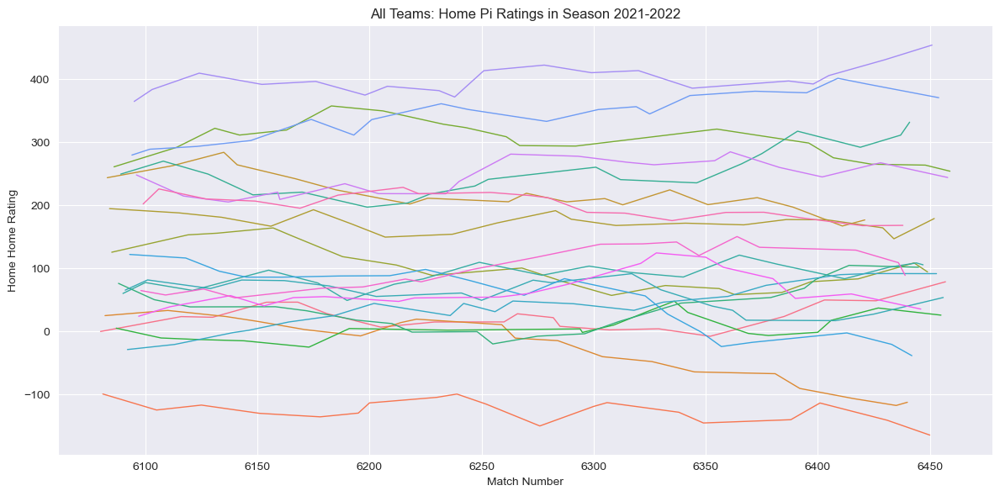

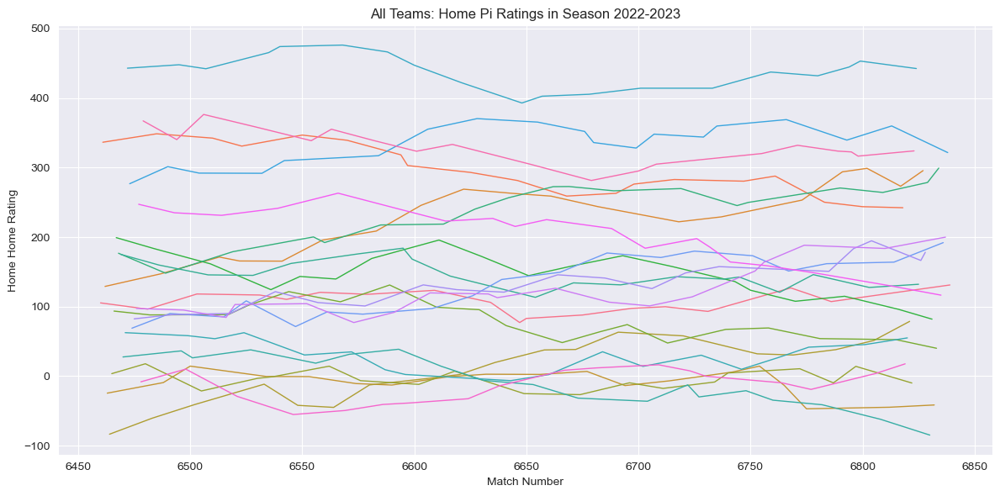

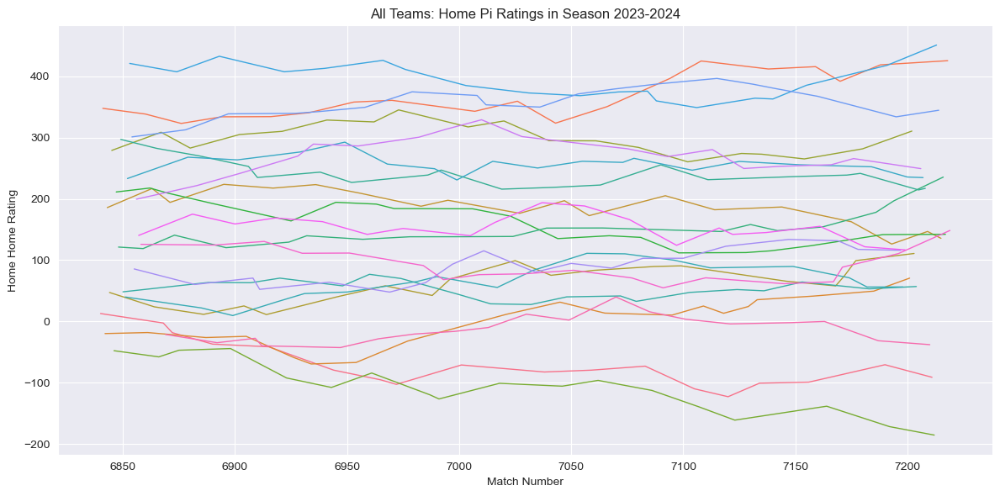

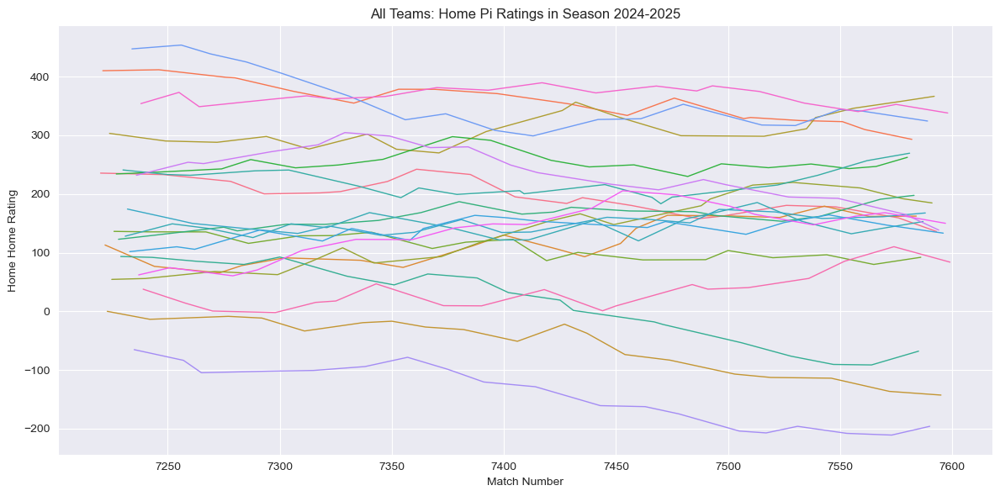

In [45]:
import matplotlib.pyplot as plt
import seaborn as sns

seasons = df['season'].unique()
for season in seasons:
    season_df = df[df['season'] == season]
    teams = season_df['home_team'].unique()
    palette = sns.color_palette("husl", len(teams))  # High-contrast palette

    plt.figure(figsize=(12, 6))
    for idx, team in enumerate(teams):
        team_df = season_df[season_df['home_team'] == team]
        plt.plot(team_df.index, team_df['Home Home Rating'], color=palette[idx], linewidth=1)

    plt.title(f'All Teams: Home Pi Ratings in Season {season}')
    plt.xlabel('Match Number')
    plt.ylabel('Home Home Rating')
    plt.tight_layout()
    plt.show()

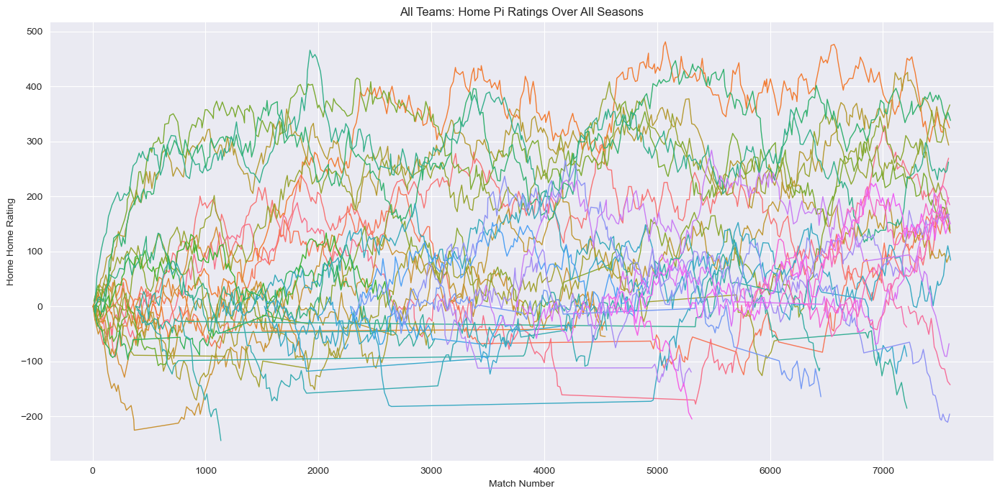

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns

teams = df['home_team'].unique()
palette = sns.color_palette("husl", len(teams))  # High-contrast palette

plt.figure(figsize=(14, 7))
for idx, team in enumerate(teams):
    team_df = df[df['home_team'] == team]
    plt.plot(team_df.index, team_df['Home Home Rating'], color=palette[idx], linewidth=1)

plt.title('All Teams: Home Pi Ratings Over All Seasons')
plt.xlabel('Match Number')
plt.ylabel('Home Home Rating')
plt.tight_layout()
plt.show()

In [48]:
# For each season, save the best home and best away team (and their ratings) into a dictionary
best_teams = {}
seasons = df['season'].unique()
for season in seasons:
    season_df = df[df['season'] == season]
    # Best home team
    last_home = season_df.groupby('home_team').tail(1)
    best_home_row = last_home.sort_values('Home Home Rating', ascending=False).iloc[0]
    best_home_team = best_home_row['home_team']
    best_home_rating = best_home_row['Home Home Rating']
    # Best away team
    last_away = season_df.groupby('away_team').tail(1)
    best_away_row = last_away.sort_values('Away Away Rating', ascending=False).iloc[0]
    best_away_team = best_away_row['away_team']
    best_away_rating = best_away_row['Away Away Rating']
    # Store in dictionary
    best_teams[season] = {
        'best_home_team': best_home_team,
        'best_home_rating': best_home_rating,
        'best_away_team': best_away_team,
        'best_away_rating': best_away_rating
    }

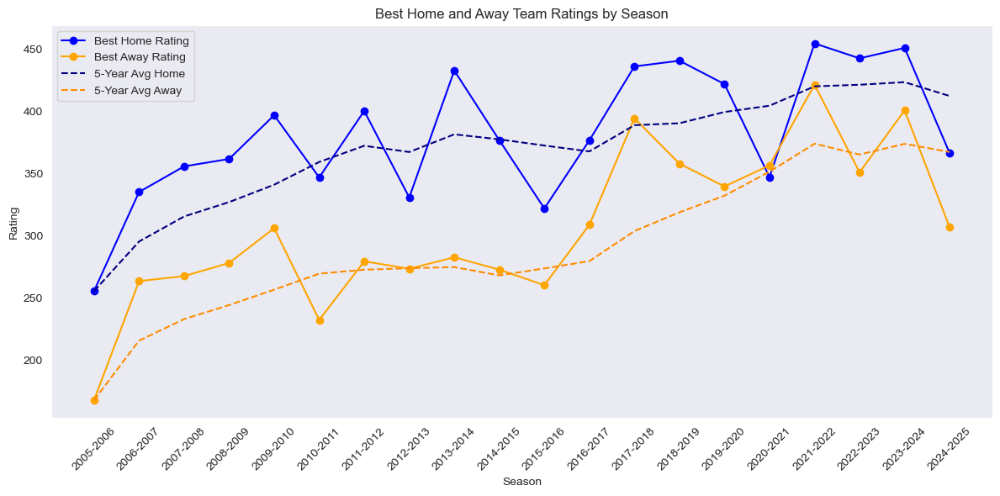

In [49]:
import matplotlib.pyplot as plt
import pandas as pd

seasons = list(best_teams.keys())
best_home_ratings = [best_teams[season]['best_home_rating'] for season in seasons]
best_away_ratings = [best_teams[season]['best_away_rating'] for season in seasons]
x = range(len(seasons))

# Calculate 5-year rolling averages
home_rolling = pd.Series(best_home_ratings).rolling(window=5, min_periods=1).mean()
away_rolling = pd.Series(best_away_ratings).rolling(window=5, min_periods=1).mean()

plt.figure(figsize=(12, 6))
plt.plot(x, best_home_ratings, marker='o', label='Best Home Rating', color='blue')
plt.plot(x, best_away_ratings, marker='o', label='Best Away Rating', color='orange')
plt.plot(x, home_rolling, linestyle='--', color='navy', label='5-Year Avg Home')
plt.plot(x, away_rolling, linestyle='--', color='darkorange', label='5-Year Avg Away')

plt.xticks(x, seasons, rotation=45)
plt.xlabel('Season')
plt.ylabel('Rating')
plt.title('Best Home and Away Team Ratings by Season')
plt.legend()
plt.grid()
plt.tight_layout()

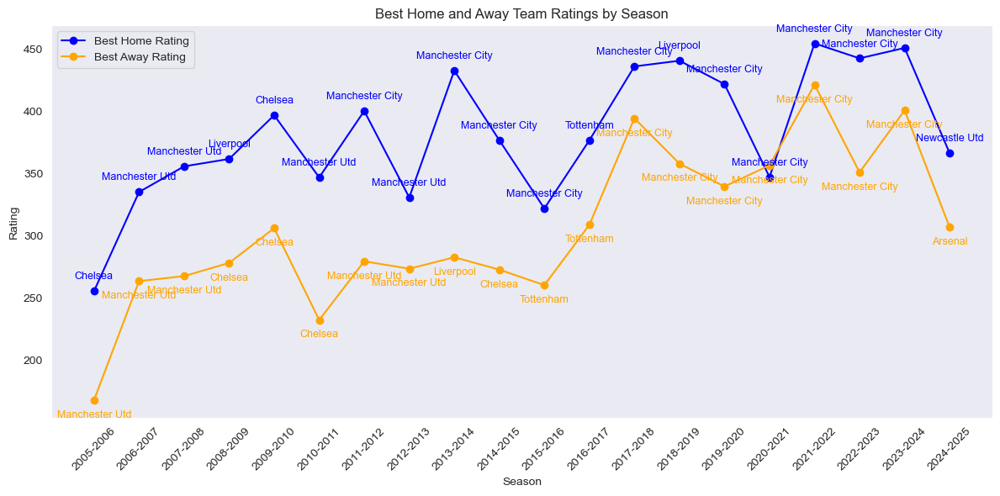

In [50]:
import matplotlib.pyplot as plt

seasons = list(best_teams.keys())
best_home_ratings = [best_teams[season]['best_home_rating'] for season in seasons]
best_away_ratings = [best_teams[season]['best_away_rating'] for season in seasons]
best_home_teams = [best_teams[season]['best_home_team'] for season in seasons]
best_away_teams = [best_teams[season]['best_away_team'] for season in seasons]
x = range(len(seasons))

plt.figure(figsize=(12, 6))
plt.plot(x, best_home_ratings, marker='o', label='Best Home Rating', color='blue')
plt.plot(x, best_away_ratings, marker='o', label='Best Away Rating', color='orange')

# Annotate team names
for i, (home_team, away_team) in enumerate(zip(best_home_teams, best_away_teams)):
    plt.annotate(home_team, (x[i], best_home_ratings[i]), textcoords="offset points", xytext=(0,10), ha='center', color='blue', fontsize=9)
    plt.annotate(away_team, (x[i], best_away_ratings[i]), textcoords="offset points", xytext=(0,-15), ha='center', color='orange', fontsize=9)

plt.xticks(x, seasons, rotation=45)
plt.xlabel('Season')
plt.ylabel('Rating')
plt.title('Best Home and Away Team Ratings by Season')
plt.legend()
plt.grid()
plt.tight_layout()

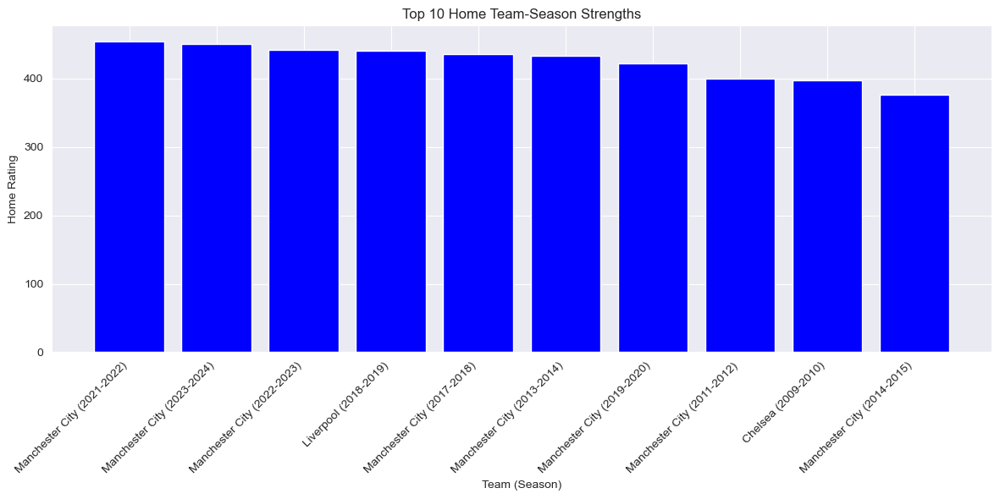

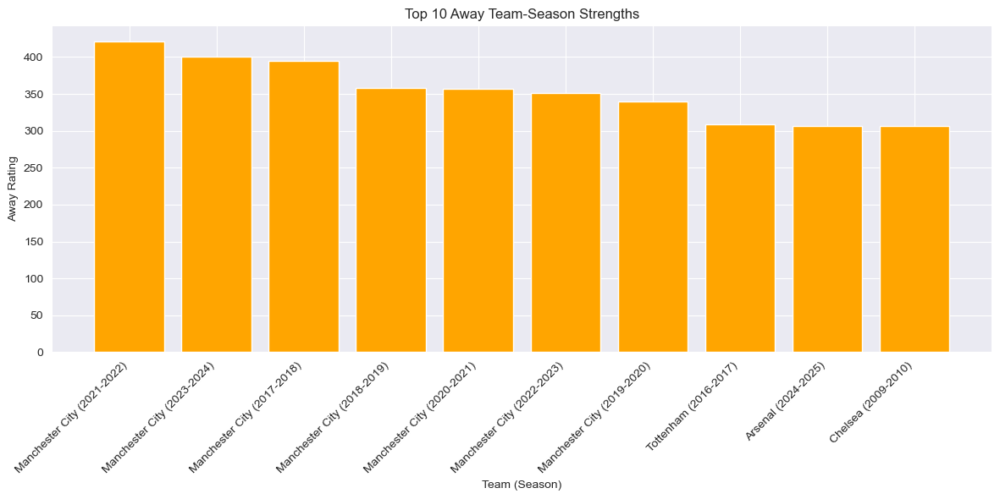

In [51]:
import matplotlib.pyplot as plt
import pandas as pd

# Prepare data for top 10 home and away team-season pairs
home_data = [(best_teams[season]['best_home_team'], season, best_teams[season]['best_home_rating']) for season in best_teams]
away_data = [(best_teams[season]['best_away_team'], season, best_teams[season]['best_away_rating']) for season in best_teams]

top10_home = sorted(home_data, key=lambda x: x[2], reverse=True)[:10]
top10_away = sorted(away_data, key=lambda x: x[2], reverse=True)[:10]

df_home = pd.DataFrame(top10_home, columns=['Team', 'Season', 'Rating'])
df_away = pd.DataFrame(top10_away, columns=['Team', 'Season', 'Rating'])

# Home chart
plt.figure(figsize=(12, 6))
plt.bar(range(10), df_home['Rating'], color='blue')
plt.xticks(range(10), [f"{row['Team']} ({row['Season']})" for _, row in df_home.iterrows()], rotation=45, ha='right')
plt.xlabel('Team (Season)')
plt.ylabel('Home Rating')
plt.title('Top 10 Home Team-Season Strengths')
plt.tight_layout()
plt.show()

# Away chart
plt.figure(figsize=(12, 6))
plt.bar(range(10), df_away['Rating'], color='orange')
plt.xticks(range(10), [f"{row['Team']} ({row['Season']})" for _, row in df_away.iterrows()], rotation=45, ha='right')
plt.xlabel('Team (Season)')
plt.ylabel('Away Rating')
plt.title('Top 10 Away Team-Season Strengths')
plt.tight_layout()
plt.show()

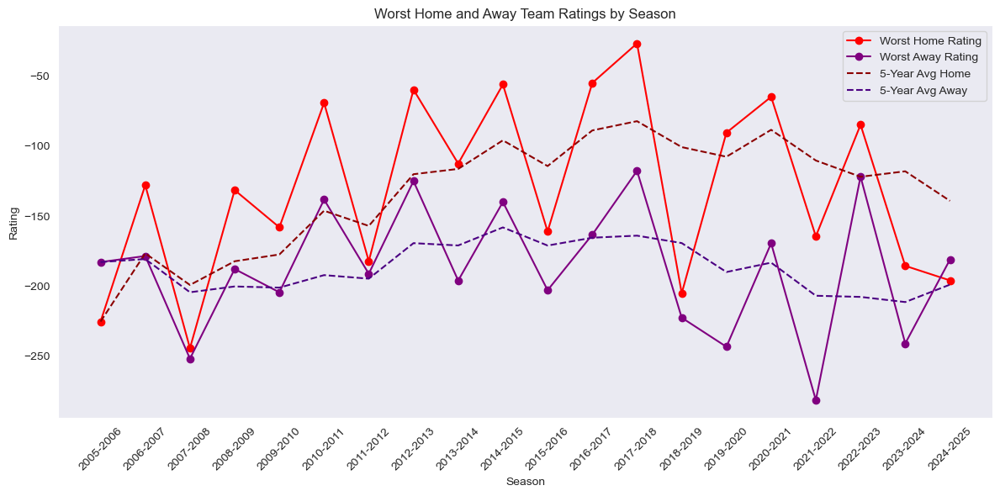

In [52]:
import matplotlib.pyplot as plt
import pandas as pd

# Build the worst_teams dictionary
worst_teams = {}
seasons = df['season'].unique()
for season in seasons:
    season_df = df[df['season'] == season]
    # Worst home team
    last_home = season_df.groupby('home_team').tail(1)
    worst_home_row = last_home.sort_values('Home Home Rating', ascending=True).iloc[0]
    worst_home_team = worst_home_row['home_team']
    worst_home_rating = worst_home_row['Home Home Rating']
    # Worst away team
    last_away = season_df.groupby('away_team').tail(1)
    worst_away_row = last_away.sort_values('Away Away Rating', ascending=True).iloc[0]
    worst_away_team = worst_away_row['away_team']
    worst_away_rating = worst_away_row['Away Away Rating']
    # Store in dictionary
    worst_teams[season] = {
        'worst_home_team': worst_home_team,
        'worst_home_rating': worst_home_rating,
        'worst_away_team': worst_away_team,
        'worst_away_rating': worst_away_rating
    }

# Prepare data for plotting
seasons = list(worst_teams.keys())
worst_home_ratings = [worst_teams[season]['worst_home_rating'] for season in seasons]
worst_away_ratings = [worst_teams[season]['worst_away_rating'] for season in seasons]
x = range(len(seasons))

# Calculate 5-year rolling averages
home_rolling = pd.Series(worst_home_ratings).rolling(window=5, min_periods=1).mean()
away_rolling = pd.Series(worst_away_ratings).rolling(window=5, min_periods=1).mean()

plt.figure(figsize=(12, 6))
plt.plot(x, worst_home_ratings, marker='o', label='Worst Home Rating', color='red')
plt.plot(x, worst_away_ratings, marker='o', label='Worst Away Rating', color='purple')
plt.plot(x, home_rolling, linestyle='--', color='darkred', label='5-Year Avg Home')
plt.plot(x, away_rolling, linestyle='--', color='indigo', label='5-Year Avg Away')

plt.xticks(x, seasons, rotation=45)
plt.xlabel('Season')
plt.ylabel('Rating')
plt.title('Worst Home and Away Team Ratings by Season')
plt.legend()
plt.grid()
plt.tight_layout()

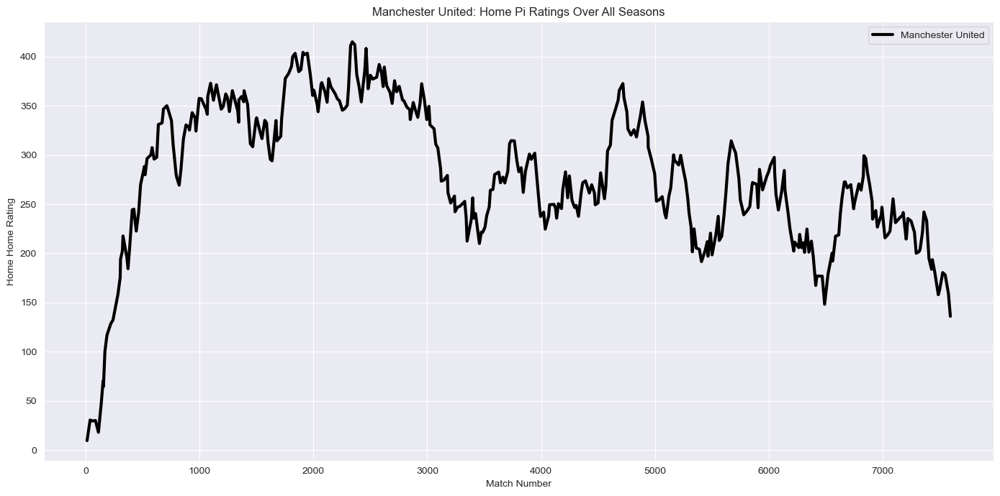

In [53]:
import matplotlib.pyplot as plt

man_utd_df = df[df['home_team'].str.lower() == "manchester utd"]

plt.figure(figsize=(14, 7))
plt.plot(man_utd_df.index, man_utd_df['Home Home Rating'], color='black', linewidth=3, label='Manchester United')
plt.title('Manchester United: Home Pi Ratings Over All Seasons')
plt.xlabel('Match Number')
plt.ylabel('Home Home Rating')
plt.legend()
plt.tight_layout()
plt.show()

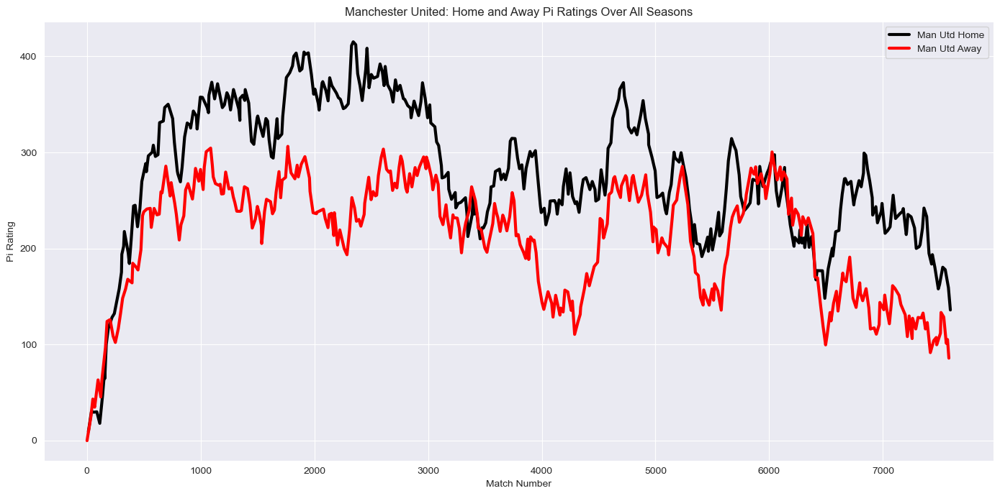

In [126]:
import matplotlib.pyplot as plt

# Filter for Manchester United home and away games
man_utd_home = df[df['home_team'].str.lower() == "manchester utd"]
man_utd_away = df[df['away_team'].str.lower() == "manchester utd"]

plt.figure(figsize=(14, 7))
plt.plot(man_utd_home.index, man_utd_home['Home Home Rating'], color='black', linewidth=3, label='Man Utd Home')
plt.plot(man_utd_away.index, man_utd_away['Away Away Rating'], color='red', linewidth=3, label='Man Utd Away')
plt.title('Manchester United: Home and Away Pi Ratings Over All Seasons')
plt.xlabel('Match Number')
plt.ylabel('Pi Rating')
plt.legend()
plt.tight_layout()
plt.show()

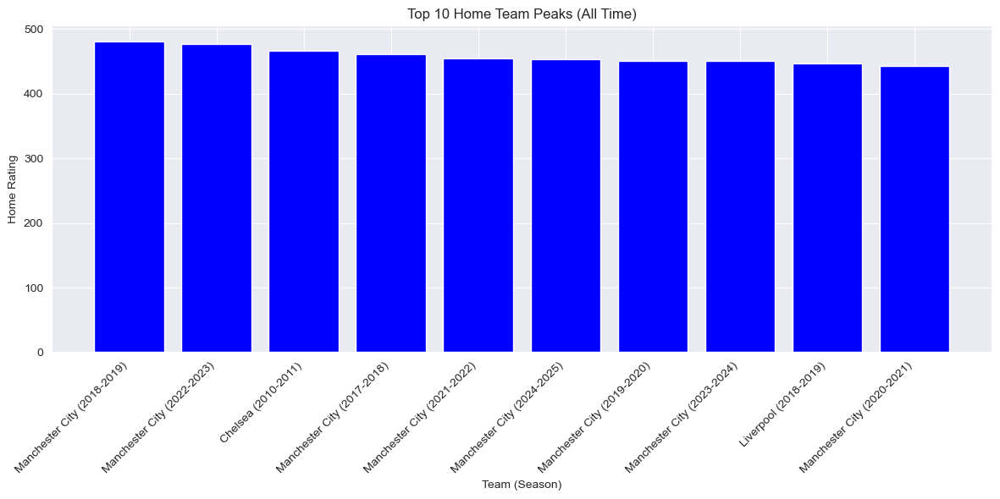

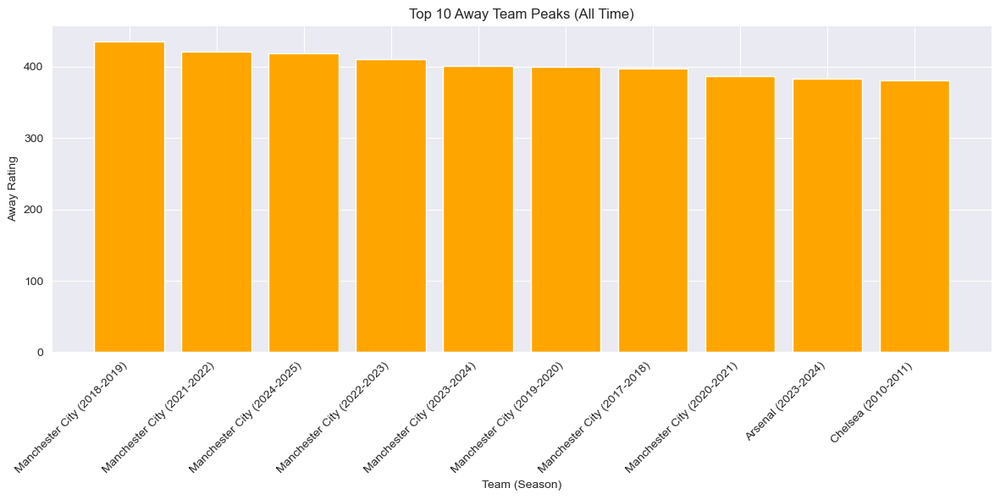

In [54]:
import matplotlib.pyplot as plt
import pandas as pd

# Top 10 home peaks
home_peaks = df.loc[df.groupby(['home_team', 'season'])['Home Home Rating'].idxmax()]
top10_home = home_peaks.nlargest(10, 'Home Home Rating')[['home_team', 'season', 'Home Home Rating']]

# Top 10 away peaks
away_peaks = df.loc[df.groupby(['away_team', 'season'])['Away Away Rating'].idxmax()]
top10_away = away_peaks.nlargest(10, 'Away Away Rating')[['away_team', 'season', 'Away Away Rating']]

# Prepare DataFrames for plotting
df_home = top10_home.rename(columns={'home_team': 'Team', 'season': 'Season', 'Home Home Rating': 'Rating'})
df_away = top10_away.rename(columns={'away_team': 'Team', 'season': 'Season', 'Away Away Rating': 'Rating'})

# Home chart
plt.figure(figsize=(12, 6))
plt.bar(range(10), df_home['Rating'], color='blue')
plt.xticks(range(10), [f"{row['Team']} ({row['Season']})" for _, row in df_home.iterrows()], rotation=45, ha='right')
plt.xlabel('Team (Season)')
plt.ylabel('Home Rating')
plt.title('Top 10 Home Team Peaks (All Time)')
plt.tight_layout()
plt.show()

# Away chart
plt.figure(figsize=(12, 6))
plt.bar(range(10), df_away['Rating'], color='orange')
plt.xticks(range(10), [f"{row['Team']} ({row['Season']})" for _, row in df_away.iterrows()], rotation=45, ha='right')
plt.xlabel('Team (Season)')
plt.ylabel('Away Rating')
plt.title('Top 10 Away Team Peaks (All Time)')
plt.tight_layout()
plt.show()

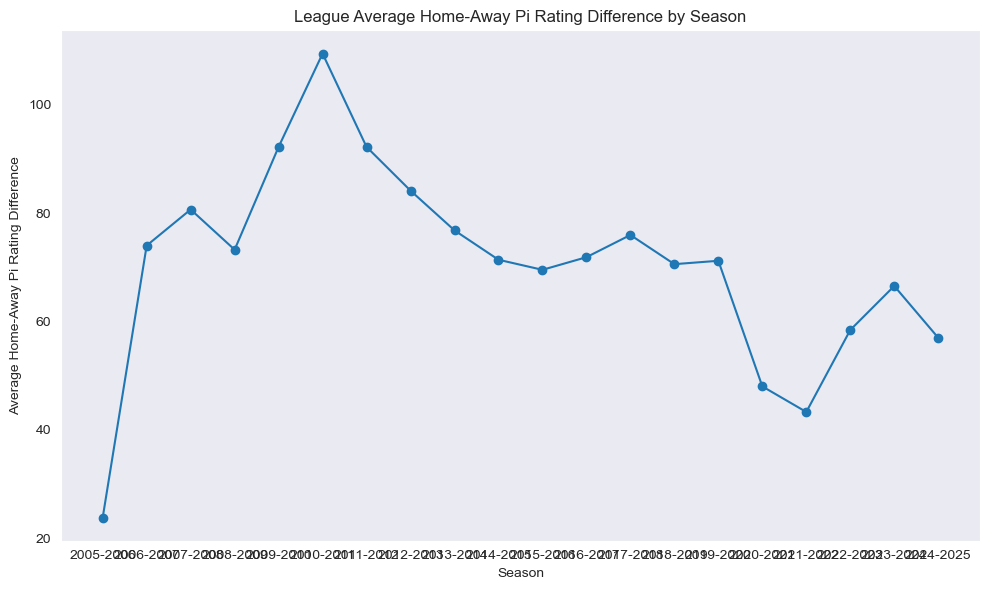

In [56]:
import matplotlib.pyplot as plt
import pandas as pd

# Compute the difference for each match
df['home_away_diff'] = df['Home Home Rating'] - df['Away Away Rating']

# Group by season and average across all teams
league_avg_diff = df.groupby('season')['home_away_diff'].mean().reset_index()

# Plot
plt.figure(figsize=(10, 6))
plt.plot(league_avg_diff['season'], league_avg_diff['home_away_diff'], marker='o')
plt.title('League Average Home-Away Pi Rating Difference by Season')
plt.xlabel('Season')
plt.ylabel('Average Home-Away Pi Rating Difference')
plt.grid()
plt.tight_layout()
plt.show()

/var/folders/k1/n035yq891w95hzqpmlll09k80000gn/T/ipykernel_16615/1291883880.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  finals['place'] = finals.groupby('season')['Home Home Rating'].rank(ascending=False, method='first')
/var/folders/k1/n035yq891w95hzqpmlll09k80000gn/T/ipykernel_16615/1291883880.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  finals['place'] = finals['place'].astype(int)


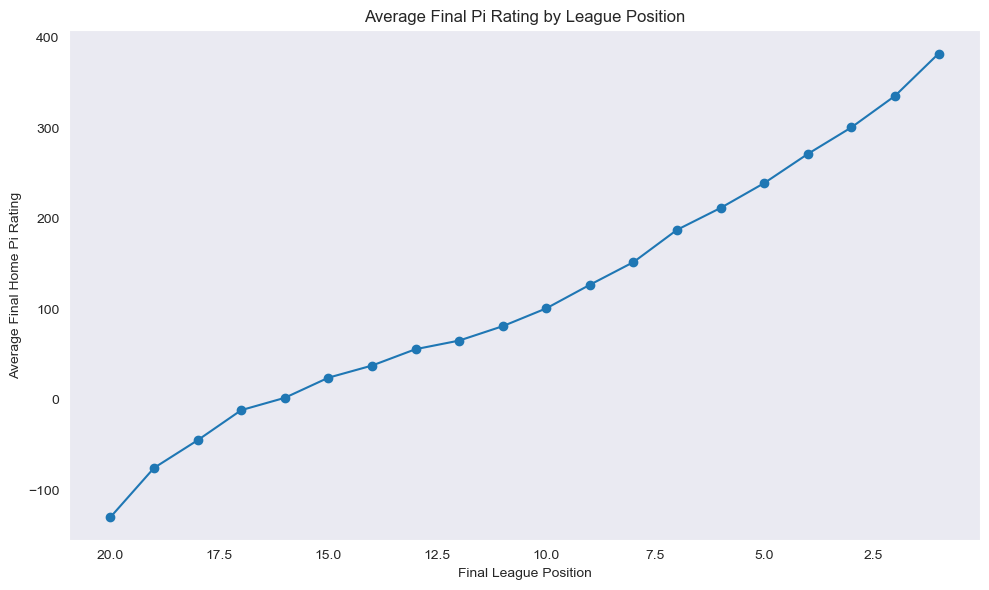

In [57]:
import pandas as pd
import matplotlib.pyplot as plt

# Get the last match for each team in each season (final rating)
finals = df.groupby(['season', 'home_team']).tail(1)

# Rank teams by final Home Home Rating within each season
finals['place'] = finals.groupby('season')['Home Home Rating'].rank(ascending=False, method='first')

# Convert place to integer
finals['place'] = finals['place'].astype(int)

# Compute average rating for each place across all seasons
avg_rating_by_place = finals.groupby('place')['Home Home Rating'].mean().reset_index()

# Plot
plt.figure(figsize=(10, 6))
plt.plot(avg_rating_by_place['place'], avg_rating_by_place['Home Home Rating'], marker='o')
plt.title('Average Final Pi Rating by League Position')
plt.xlabel('Final League Position')
plt.ylabel('Average Final Home Pi Rating')
plt.gca().invert_xaxis()  # 1st place on the left
plt.grid()
plt.tight_layout()
plt.show()

In [58]:
avg_rating_by_place

,place,Home Home Rating
0,1,382.533016
1,2,335.787265
2,3,300.955012
3,4,271.611722
4,5,239.370185
5,6,211.914707
6,7,187.708911
7,8,151.995099
8,9,126.938651
9,10,100.870989
